# Mapping LA Traffic Accidents

In [1]:
#We'll start by importing the libraries we need
# for data wrangling
import pandas as pd

# for interactive plots
import plotly.express as px

# to import open data
from sodapy import Socrata

In [2]:
# make sure to install these packages before running:
# pip install pandas
# pip install sodapy

import pandas as pd
from sodapy import Socrata

# Unauthenticated client only works with public data sets. Note 'None'
# in place of application token, and no username or password:
client = Socrata("data.lacity.org", None)

# First 2000 results, returned as JSON from API / converted to Python list of
# dictionaries by sodapy.
results = client.get("d5tf-ez2w", limit=2000)

# Convert to pandas DataFrame
collisions = pd.DataFrame.from_records(results)

# print it with .sample, which gives you random rows
collisions.sample(2)

,dr_no,date_rptd,date_occ,time_occ,area,area_name,rpt_dist_no,crm_cd,crm_cd_desc,mocodes,...,premis_desc,location,cross_street,location_1,:@computed_region_qz3q_ghft,:@computed_region_k96s_3jcv,:@computed_region_tatf_ua23,:@computed_region_ur2y_g4cx,:@computed_region_kqwf_mjcx,:@computed_region_2dna_qi2s
1609,211105940,2021-02-26T00:00:00.000,2020-02-26T00:00:00.000,1145,11,Northeast,1107,997,TRAFFIC COLLISION,0605 3101 3401 3701 4024 3011 3034,...,STREET,OAK GROVE DR,GLACIER,"{'latitude': '34.1331', 'longitude': '-118.191...",23672,357,512,NaN,9,60
727,171326132,2017-12-15T00:00:00.000,2017-12-15T00:00:00.000,0900,13,Newton,1342,997,TRAFFIC COLLISION,0605 3101 3401 3701 3004 3030 3036,...,STREET,JEFFERSON BL,AVALON BL,"{'latitude': '34.0154', 'longitude': '-118.265...",22727,NaN,965,7,13,6


### Here I'm telling it to sort the data from 2018 to 2023

In [3]:
#only look at traffic collisions from 2018 to 2023
results = client.get("d5tf-ez2w", 
                     limit = 10000, # putting an arbitrary high number (otherwise defaults to 1000)
                     where = "date_occ between '2018-01-01T00:00:00' and '2023-02-01T00:00:00'"
                    )

In [4]:
# Convert to pandas DataFrame
collisions = pd.DataFrame.from_records(results)

### Data Exploration and Analysis

In [5]:
# how many rows and columns?
collisions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 18 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   dr_no         10000 non-null  object
 1   date_rptd     10000 non-null  object
 2   date_occ      10000 non-null  object
 3   time_occ      10000 non-null  object
 4   area          10000 non-null  object
 5   area_name     10000 non-null  object
 6   rpt_dist_no   10000 non-null  object
 7   crm_cd        10000 non-null  object
 8   crm_cd_desc   10000 non-null  object
 9   mocodes       9823 non-null   object
 10  vict_age      8389 non-null   object
 11  vict_sex      9772 non-null   object
 12  vict_descent  9765 non-null   object
 13  premis_cd     9998 non-null   object
 14  premis_desc   9998 non-null   object
 15  location      10000 non-null  object
 16  cross_street  9647 non-null   object
 17  location_1    10000 non-null  object
dtypes: object(18)
memory usage: 1.4+ MB


In [6]:
# what fields and datatypes?
results = collisions.dtypes

print(results)

dr_no           object
date_rptd       object
date_occ        object
time_occ        object
area            object
area_name       object
rpt_dist_no     object
crm_cd          object
crm_cd_desc     object
mocodes         object
vict_age        object
vict_sex        object
vict_descent    object
premis_cd       object
premis_desc     object
location        object
cross_street    object
location_1      object
dtype: object


In [7]:
# what are the first 5 rows?
collisions.head(5)

,dr_no,date_rptd,date_occ,time_occ,area,area_name,rpt_dist_no,crm_cd,crm_cd_desc,mocodes,vict_age,vict_sex,vict_descent,premis_cd,premis_desc,location,cross_street,location_1
0,180104039,2018-01-01T00:00:00.000,2018-01-01T00:00:00.000,1740,01,Central,0192,997,TRAFFIC COLLISION,3101 3401 3701 3009 3025 3036,50,F,O,101,STREET,VENICE BL,GRAND AV,"{'latitude': '34.0363', 'longitude': '-118.267..."
1,180104668,2018-01-10T00:00:00.000,2018-01-01T00:00:00.000,1540,01,Central,0182,997,TRAFFIC COLLISION,3101 3401 3701 3004 3030,NaN,M,W,101,STREET,VERDUGO RD,YUKON,"{'latitude': '34.042', 'longitude': '-118.2625..."
2,180104040,2018-01-01T00:00:00.000,2018-01-01T00:00:00.000,1900,01,Central,0154,997,TRAFFIC COLLISION,3101 3401 3701 3006 3030 3032,25,M,W,108,PARKING LOT,SPRING,6TH,"{'latitude': '34.046', 'longitude': '-118.2509..."
3,180104001,2018-01-01T00:00:00.000,2018-01-01T00:00:00.000,0038,01,Central,0192,997,TRAFFIC COLLISION,3101 3401 3701 3002 3011 3034 3036,NaN,M,H,101,STREET,GRAND,WASHINGTON,"{'latitude': '34.0327', 'longitude': '-118.268..."
4,180104044,2018-01-01T00:00:00.000,2018-01-01T00:00:00.000,1030,01,Central,0182,997,TRAFFIC COLLISION,3101 3401 3701 3004 3026 3036,33,M,B,101,STREET,HOPE,PICO,"{'latitude': '34.0395', 'longitude': '-118.265..."


### Using plotly to create a bar chart

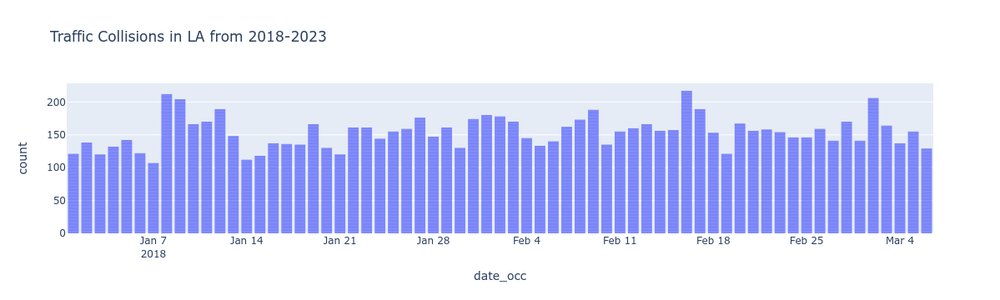

In [8]:
# a simple bar chart, putting date on the x-axis
fig = px.bar(collisions,
       x='date_occ',
       title='Traffic Collisions in LA from 2018-2023'
      )

# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

# show the figure
fig.show()

### Oh No! 
There are too many data entries to show even the whole year of 2018. I need to narrow down the data.

In [9]:
#checking if the missing data '(0°, 0°)' is in the data set #false means there is no missing data
print("0°, 0°" in collisions)

False


In [10]:
#only look at traffic collisions from November 2022 to February 2023
new_results = client.get("d5tf-ez2w", 
                     limit = 10000, # putting an arbitrary high number (otherwise defaults to 1000)
                     where = "date_occ between '2022-11-01T00:00:00' and '2023-02-01T00:00:00'"
                    )

In [11]:
# Convert to pandas DataFrame
recent_collisions = pd.DataFrame.from_records(new_results)

In [12]:
# checking the data
# how many rows and columns?
recent_collisions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4045 entries, 0 to 4044
Data columns (total 18 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   dr_no         4045 non-null   object
 1   date_rptd     4045 non-null   object
 2   date_occ      4045 non-null   object
 3   time_occ      4045 non-null   object
 4   area          4045 non-null   object
 5   area_name     4045 non-null   object
 6   rpt_dist_no   4045 non-null   object
 7   crm_cd        4045 non-null   object
 8   crm_cd_desc   4045 non-null   object
 9   vict_age      3613 non-null   object
 10  vict_sex      4013 non-null   object
 11  vict_descent  4012 non-null   object
 12  premis_cd     4045 non-null   object
 13  premis_desc   4045 non-null   object
 14  location      4045 non-null   object
 15  cross_street  3921 non-null   object
 16  location_1    4045 non-null   object
 17  mocodes       3961 non-null   object
dtypes: object(18)
memory usage: 569.0+ KB


In [13]:
# what are the first 5 rows?
recent_collisions.head(5)

,dr_no,date_rptd,date_occ,time_occ,area,area_name,rpt_dist_no,crm_cd,crm_cd_desc,vict_age,vict_sex,vict_descent,premis_cd,premis_desc,location,cross_street,location_1,mocodes
0,220618602,2022-11-07T00:00:00.000,2022-11-01T00:00:00.000,0700,06,Hollywood,0615,997,TRAFFIC COLLISION,27,F,W,101,STREET,CAHUENGA BL,HOLLYWOOD BL,"{'latitude': '34.1267', 'longitude': '-118.331...",NaN
1,220816273,2022-11-01T00:00:00.000,2022-11-01T00:00:00.000,0645,08,West LA,0813,997,TRAFFIC COLLISION,37,M,H,101,STREET,SUNSET BL,CHURCH LN,"{'latitude': '34.0724', 'longitude': '-118.467...",3004 3024 4027 3035 3037 3103 3401 3701
2,221115816,2022-11-02T00:00:00.000,2022-11-01T00:00:00.000,2230,11,Northeast,1109,997,TRAFFIC COLLISION,41,M,F,101,STREET,COLORADO BL,TOWNSEND AV,"{'latitude': '34.1395', 'longitude': '-118.201...",3101 3401 3701 3004 3037 0605 3025 3033 3039 4024
3,221320242,2022-11-01T00:00:00.000,2022-11-01T00:00:00.000,1820,13,Newton,1343,997,TRAFFIC COLLISION,26,F,H,101,STREET,WADSWORTH AV,JEFFERSON BL,"{'latitude': '34.0118', 'longitude': '-118.258...",0605 3004 3026 3029 3101 4024 3401 3701 3036 3033
4,220319543,2022-11-03T00:00:00.000,2022-11-01T00:00:00.000,0350,03,Southwest,0399,997,TRAFFIC COLLISION,28,M,H,101,STREET,VERNON AV,FLOWER ST,"{'latitude': '34.0038', 'longitude': '-118.282...",3004 3026 3029 4003


### Let's try putting this new data into a bar chart

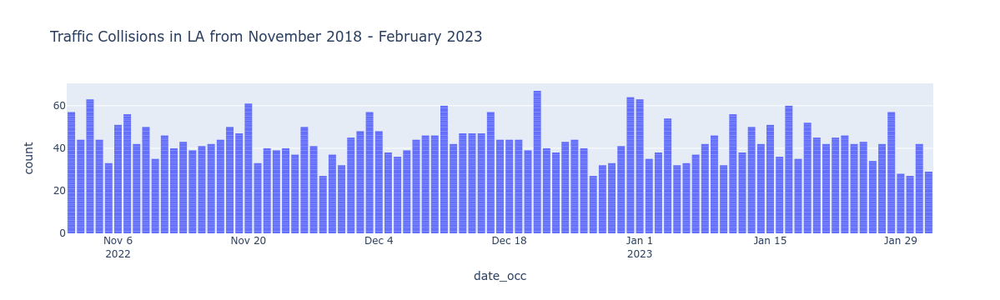

In [14]:
# a simple bar chart, putting date on the x-axis
fig = px.bar(recent_collisions,
       x='date_occ',
       title='Traffic Collisions in LA from November 2018 - February 2023'
      )

# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

# show the figure
fig.show()

### This looks a lot better
Let's try from 2022

In [15]:
#only look at traffic collisions from January 2022 to December 2022
year_results = client.get("d5tf-ez2w", 
                     limit = 50000, # putting an arbitrary high number (otherwise defaults to 1000)
                     where = "date_occ between '2022-01-01T00:00:00' and '2022-12-31T00:00:00'"
                    )

In [16]:
# Convert to pandas DataFrame
lastyear_collisions = pd.DataFrame.from_records(year_results)

In [17]:
#check the data
# how many rows and columns?
lastyear_collisions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16313 entries, 0 to 16312
Data columns (total 18 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   dr_no         16313 non-null  object
 1   date_rptd     16313 non-null  object
 2   date_occ      16313 non-null  object
 3   time_occ      16313 non-null  object
 4   area          16313 non-null  object
 5   area_name     16313 non-null  object
 6   rpt_dist_no   16313 non-null  object
 7   crm_cd        16313 non-null  object
 8   crm_cd_desc   16313 non-null  object
 9   mocodes       16171 non-null  object
 10  vict_age      14784 non-null  object
 11  vict_sex      16009 non-null  object
 12  vict_descent  15993 non-null  object
 13  premis_cd     16313 non-null  object
 14  premis_desc   16313 non-null  object
 15  location      16313 non-null  object
 16  cross_street  15664 non-null  object
 17  location_1    16313 non-null  object
dtypes: object(18)
memory usage: 2.2+ MB


## Data cleanup (yoh)

Here we split the data in location_1 column that is in a json (dictionary) format into separate columns for latitude and longitude.

This allows the map further below to work!

In [18]:
# create latitudue/longitude columns
lastyear_collisions['latitude'] = pd.json_normalize(lastyear_collisions['location_1'])['latitude']
lastyear_collisions['longitude'] = pd.json_normalize(lastyear_collisions['location_1'])['longitude']

# convert to floats
lastyear_collisions['latitude'] = lastyear_collisions['latitude'].astype('float')
lastyear_collisions['longitude'] = lastyear_collisions['longitude'].astype('float')


In [19]:
lastyear_collisions.tail(5)

,dr_no,date_rptd,date_occ,time_occ,area,area_name,rpt_dist_no,crm_cd,crm_cd_desc,mocodes,vict_age,vict_sex,vict_descent,premis_cd,premis_desc,location,cross_street,location_1,latitude,longitude
16308,232104085,2023-01-04T00:00:00.000,2022-12-31T00:00:00.000,0500,21,Topanga,2134,997,TRAFFIC COLLISION,3101 3006 3028 3030 3037 4021,40,M,O,101,STREET,SATICOY ST,FALLBROOK AV,"{'latitude': '34.2083', 'longitude': '-118.623...",34.2083,-118.6234
16309,231604002,2023-01-01T00:00:00.000,2022-12-31T00:00:00.000,2320,16,Foothill,1667,997,TRAFFIC COLLISION,3101 3011 3028 4016 3030 3034 3037,99,M,O,102,SIDEWALK,SUNLAND BL,SHADOW ISLAND,"{'latitude': '34.2498', 'longitude': '-118.346...",34.2498,-118.3469
16310,231204524,2023-01-10T00:00:00.000,2022-12-31T00:00:00.000,1521,12,77th Street,1269,997,TRAFFIC COLLISION,4025 3004 3028 3030,37,M,H,101,STREET,300 E MANCHESTER AV,NaN,"{'latitude': '33.9638', 'longitude': '-118.262...",33.9638,-118.2629
16311,230204688,2022-12-31T00:00:00.000,2022-12-31T00:00:00.000,1240,02,Rampart,0218,997,TRAFFIC COLLISION,0605 3030 4024,35,M,O,101,STREET,1500 W SUNSET BL,NaN,"{'latitude': '34.0758', 'longitude': '-118.255...",34.0758,-118.2552
16312,231504013,2023-01-01T00:00:00.000,2022-12-31T00:00:00.000,1230,15,N Hollywood,1562,997,TRAFFIC COLLISION,3004 3026 3029 3037 4015 3101,60,M,H,101,STREET,LAUREL CANYON BL,N LANDALE ST,"{'latitude': '34.1522', 'longitude': '-118.396...",34.1522,-118.3965


### I figured out how to see all the data
I just needed to increase the limit to a really high number and it was able to capture everything in 2022

But now lets see how a bar chart with this new data looks like!

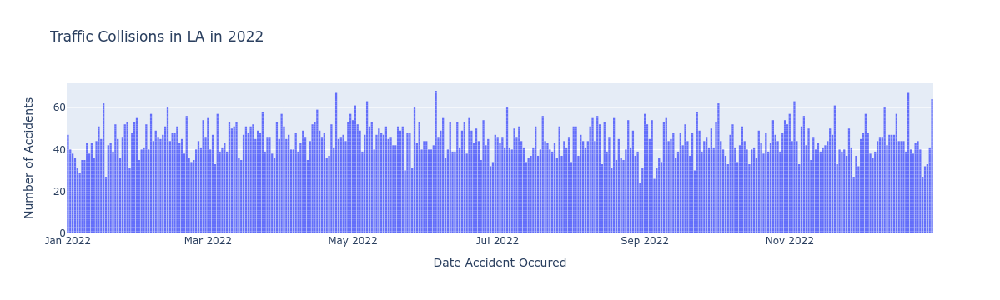

In [20]:
#new bar chart
# a simple bar chart, putting date on the x-axis
fig = px.bar(lastyear_collisions,
       x='date_occ',
       title='Traffic Collisions in LA in 2022',
       labels={
            'date_occ':'Date Accident Occured',
            'count':'Number of Accidents'
       }
            )

# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

# show the figure
fig.show()

### Trying to map the data

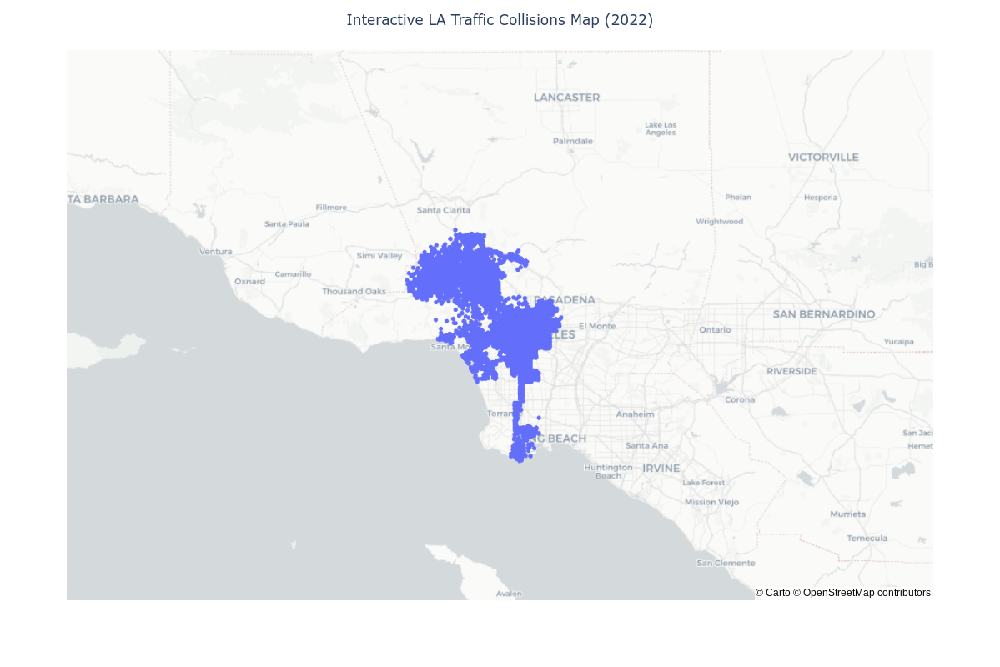

In [21]:
fig = px.scatter_mapbox(lastyear_collisions,
                        lat='latitude',
                        lon='longitude',
                        mapbox_style="carto-positron")

# options on the layout
fig.update_layout(
    width = 800,
    height = 800,
    title = "Interactive LA Traffic Collisions Map (2022)",
    title_x=0.5 # aligns title to center
)

fig.show()

# Now let's map traffic collisions by race

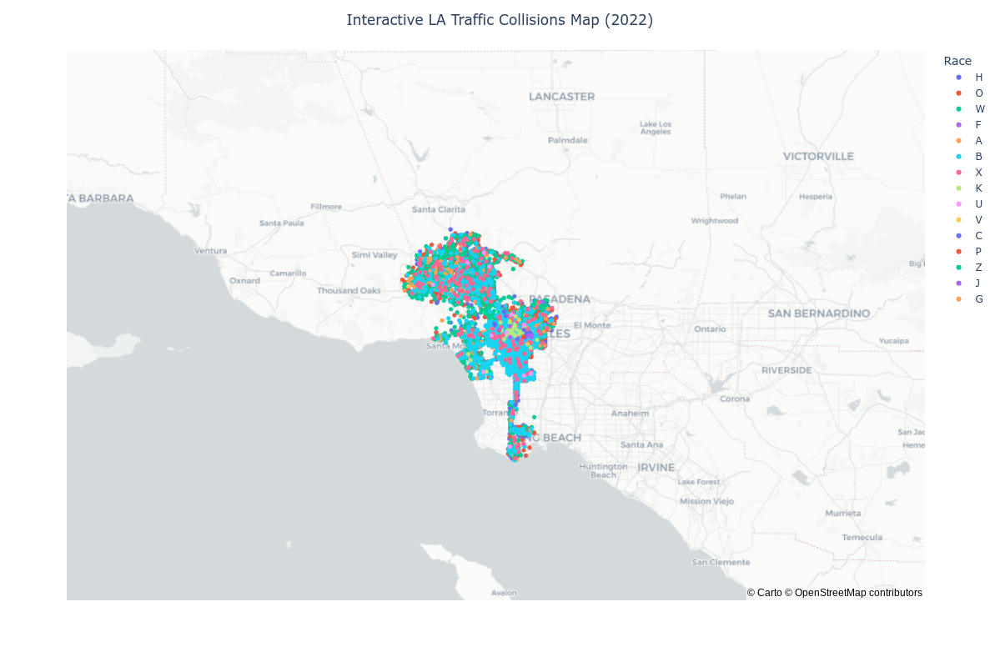

In [45]:
fig = px.scatter_mapbox(lastyear_collisions, 
                        lat="latitude", 
                        lon="longitude", 
                        color="vict_descent",
                        labels={'vict_descent':'Race'},
                        mapbox_style="carto-positron"
                       )

# options on the layout
fig.update_layout(
    width = 800,
    height = 800,
    title = "Interactive LA Traffic Collisions Map (2022)",
    title_x=0.5 # aligns title to center
)


fig.show()

# Race is as follows:
A - Other Asian 
B - Black 
C - Chinese 
D - Cambodian 
F - Filipino 
G - Guamanian 
H - Hispanic/Latin/Mexican 
I - American Indian/Alaskan Native 
J - Japanese 
K - Korean 
L - Laotian 
O - Other 
P - Pacific Islander 
S - Samoan 
U - Hawaiian 
V - Vietnamese 
W - White 
X - Unknown 
Z - Asian Indian

In [27]:
#Creating collision maps isolating by race
def race_map(race='H'):
    
    fig = px.scatter_mapbox(
                            lastyear_collisions[lastyear_collisions.vict_descent==race], 
                            lat="latitude", 
                            lon="longitude", 
                            color="vict_descent",
                            labels={'vict_descent':'Race'},
                            mapbox_style="carto-positron"
    )

    # options on the layout
    fig.update_layout(
        width = 600,
        height = 600,
        title = "Interactive LA Traffic Collisions Map (2022)<br>Showing where descent label is "+race,
        title_x=0.5 # aligns title to center
    )

    fig.show()

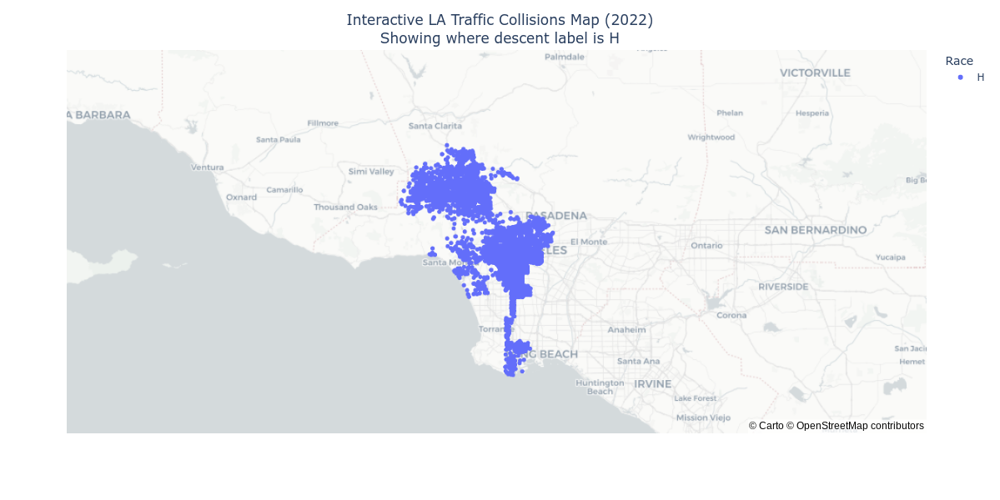

In [26]:
#showing collision map involving only those labeled as Hispanic/Latin/Mexican
race_map(race='H')

# Using a loop to show collisions by each race

In [43]:
# get a list of distinct race values
race_list = lastyear_collisions.vict_descent.unique().tolist()
race_list

['H', 'O', 'W', 'F', 'A', 'B', 'X', 'K', 'U', 'V', 'C', 'P', 'Z', 'J', 'G']

In [42]:
#dropping nan or null value
lastyear_collisions.dropna(inplace=True)

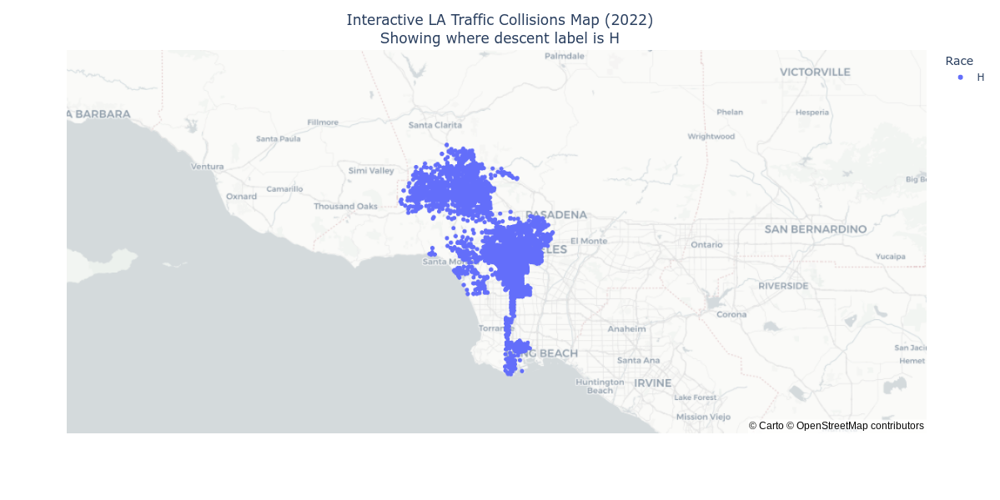

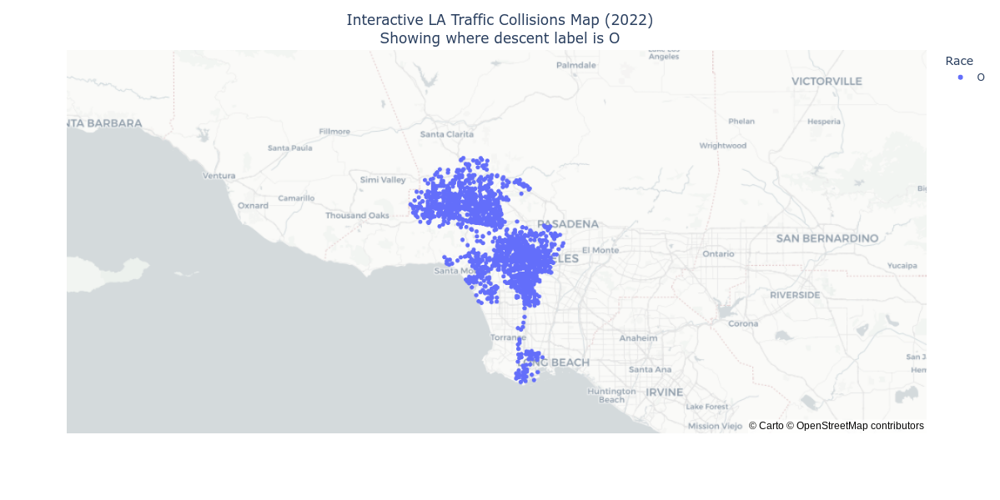

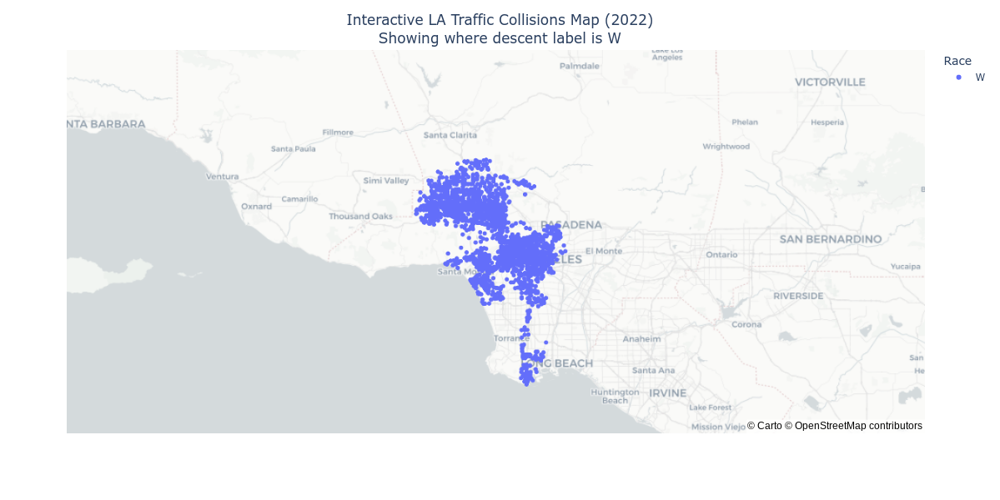

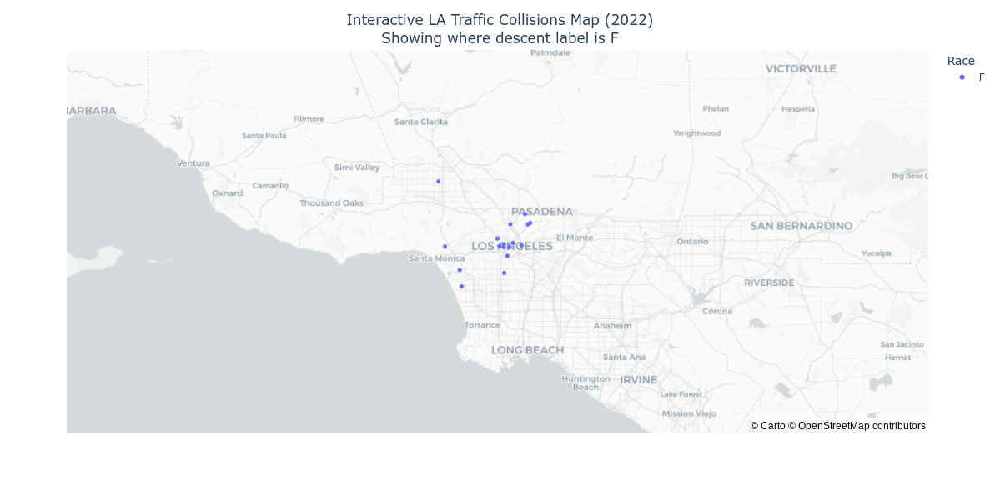

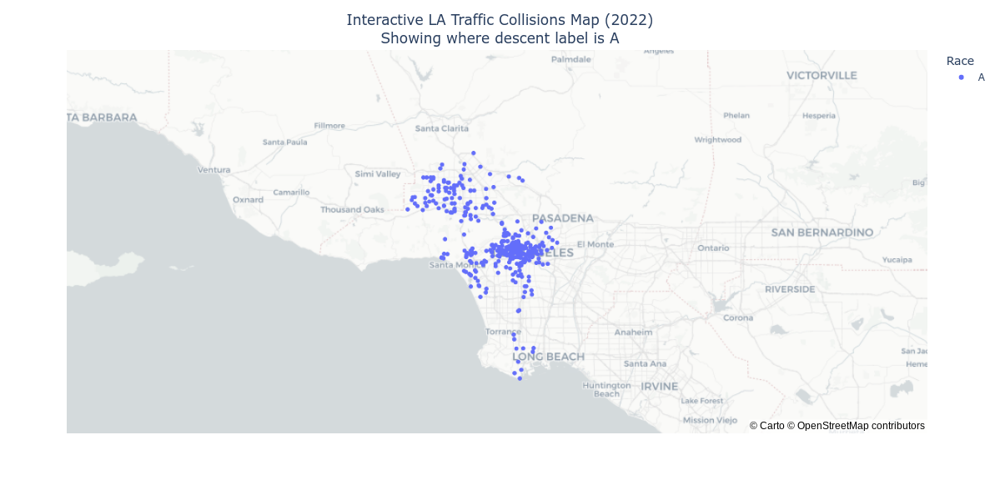

...

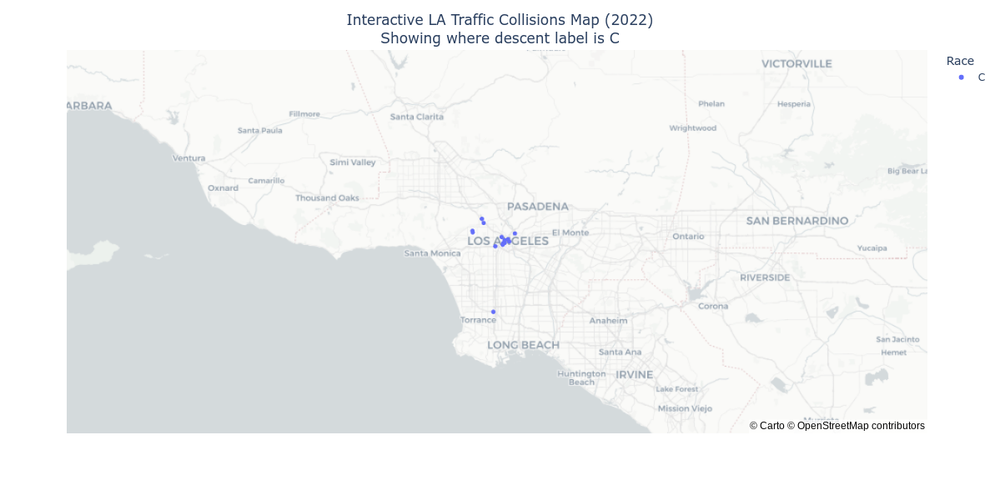

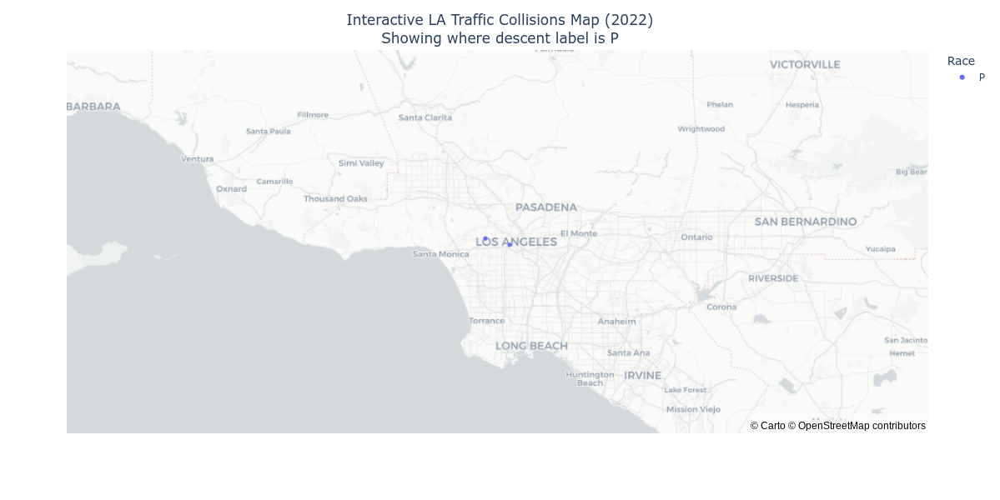

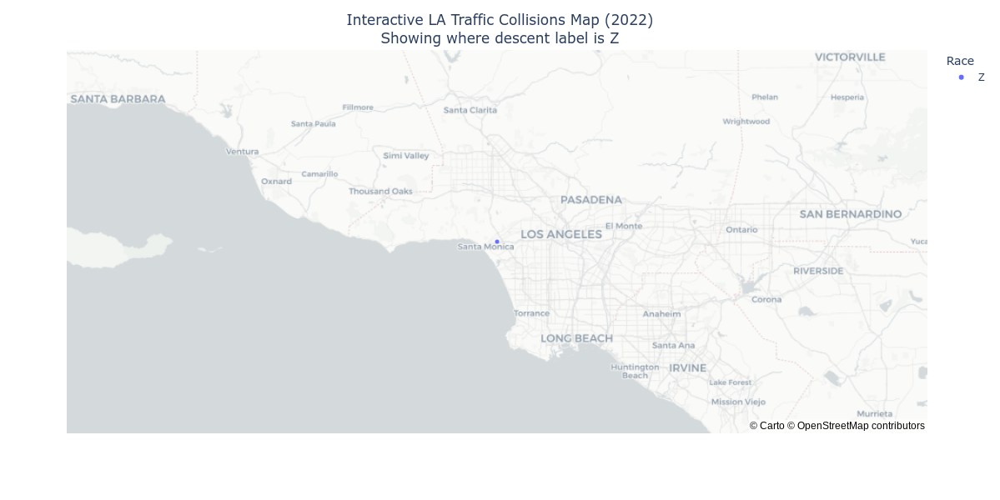

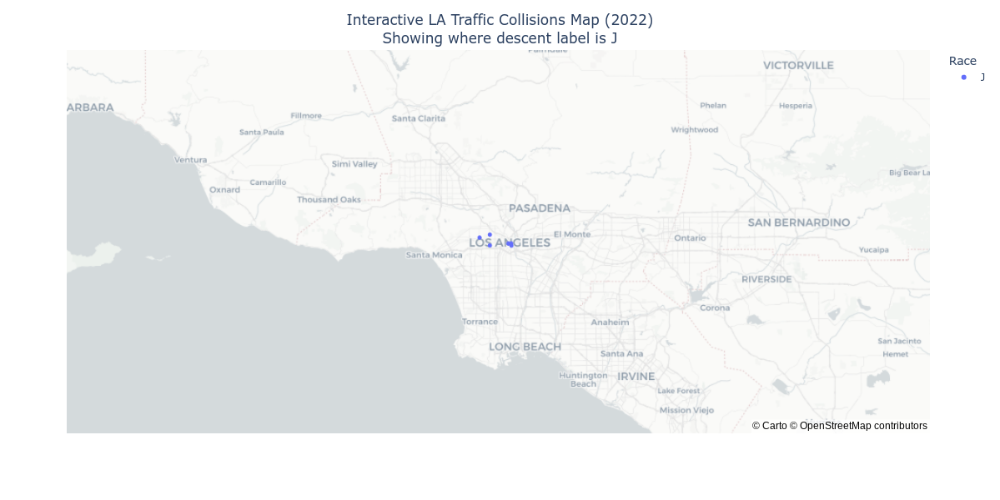

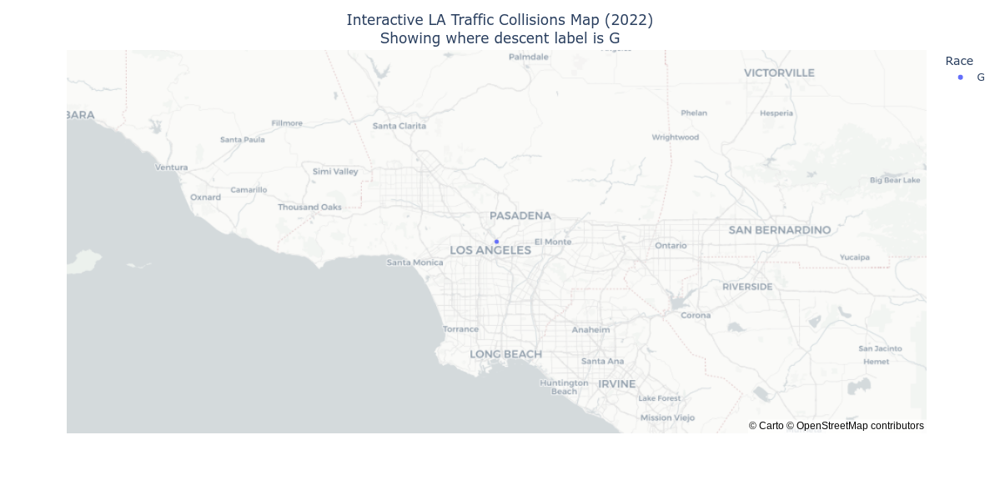

In [44]:
for race in race_list:
    race_map(race)

# Summarize by Neighborhood

In [47]:
import geopandas as gpd

In [49]:
neighborhoods = gpd.read_file("https://services5.arcgis.com/7nsPwEMP38bSkCjy/arcgis/rest/services/LA_Times_Neighborhoods/FeatureServer/0/query?outFields=*&where=1%3D1&f=geojson")

<AxesSubplot: >

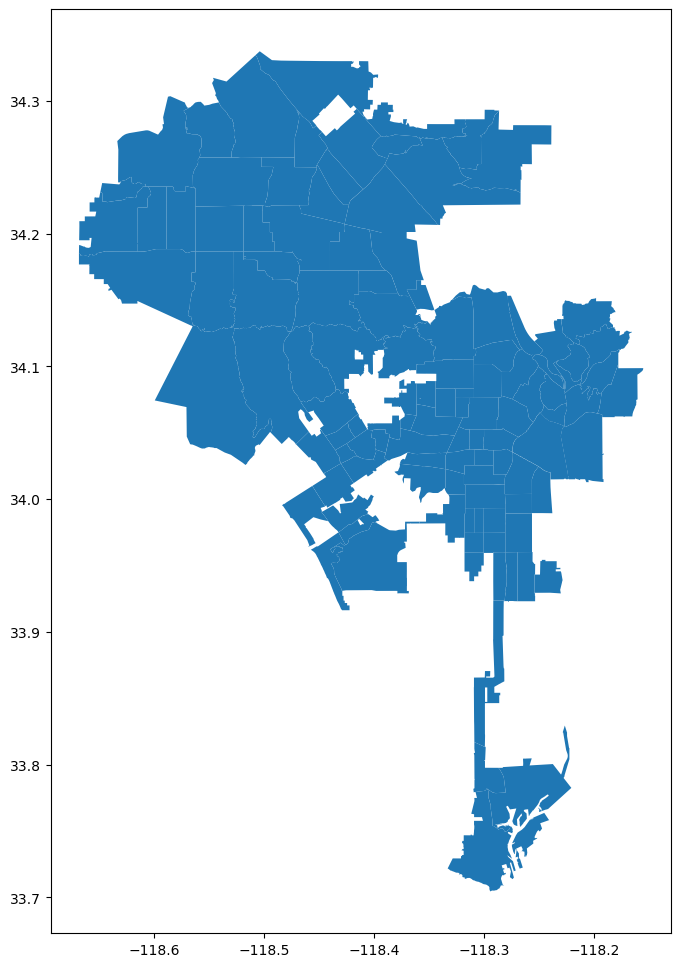

In [50]:
neighborhoods.plot(figsize=(12,12))

<AxesSubplot: >

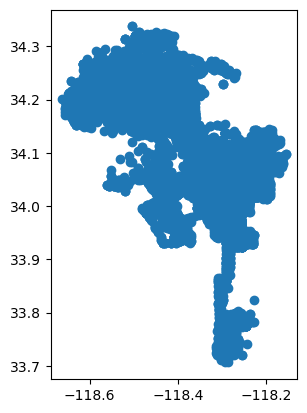

In [51]:
# convert lastyear_collisions to geodataframe
gdf = gpd.GeoDataFrame(
    lastyear_collisions, geometry=gpd.points_from_xy(lastyear_collisions.longitude, lastyear_collisions.latitude),crs=4326)

# check that it can be mapped
gdf.plot()

In [52]:
# conduct a spatial join (i.e. assign each collision to the neighborhood it is in)
collision_by_neighborhood = gpd.sjoin(neighborhoods, gdf) #Spatial join Points to polygons
collision_by_neighborhood

,OBJECTID,name,geometry,index_right,dr_no,date_rptd,date_occ,time_occ,area,area_name,...,vict_age,vict_sex,vict_descent,premis_cd,premis_desc,location,cross_street,location_1,latitude,longitude
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",3335,220307611,2022-03-17T00:00:00.000,2022-03-17T00:00:00.000,1230,03,Southwest,...,30,F,H,101,STREET,JEFFERSON BL,HOBART BL,"{'latitude': '34.0256', 'longitude': '-118.307...",34.0256,-118.3078
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",287,220304480,2022-01-12T00:00:00.000,2022-01-08T00:00:00.000,1900,03,Southwest,...,37,F,B,101,STREET,HOBART BL,JEFFERSON BL,"{'latitude': '34.0256', 'longitude': '-118.307...",34.0256,-118.3078
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",1414,220305437,2022-02-03T00:00:00.000,2022-02-03T00:00:00.000,1840,03,Southwest,...,63,M,H,101,STREET,JEFFERSON,HOBART,"{'latitude': '34.0256', 'longitude': '-118.307...",34.0256,-118.3078
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",9920,220314818,2022-08-08T00:00:00.000,2022-08-08T00:00:00.000,1750,03,Southwest,...,20,M,H,101,STREET,WESTERN AV,31ST ST,"{'latitude': '34.0265', 'longitude': '-118.308...",34.0265,-118.3089
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",15470,220321740,2022-12-12T00:00:00.000,2022-12-12T00:00:00.000,1720,03,Southwest,...,54,M,H,101,STREET,30TH ST,HOBART BL,"{'latitude': '34.0273', 'longitude': '-118.307...",34.0273,-118.3078
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113,114,Lake Balboa,"POLYGON ((-118.50116 34.22114, -118.50116 34.2...",5394,221008586,2022-04-30T00:00:00.000,2022-04-30T00:00:00.000,0930,10,West Valley,...,25,M,H,101,STREET,BURTON,ENCINO,"{'latitude': '34.2201', 'longitude': '-118.514...",34.2201,-118.5143
113,114,Lake Balboa,"POLYGON ((-118.50116 34.22114, -118.50116 34.2...",10478,221013002,2022-08-21T00:00:00.000,2022-08-20T00:00:00.000,2045,10,West Valley,...,67,F,W,101,STREET,BALBOA BL,BALBOA PL,"{'latitude': '34.2179', 'longitude': '-118.501...",34.2179,-118.5014
113,114,Lake Balboa,"POLYGON ((-118.50116 34.22114, -118.50116 34.2...",14196,221016437,2022-11-13T00:00:00.000,2022-11-13T00:00:00.000,0745,10,West Valley,...,50,M,O,101,STREET,BALBOA BL,BALBOA PL,"{'latitude': '34.2179', 'longitude': '-118.501...",34.2179,-118.5014
113,114,Lake Balboa,"POLYGON ((-118.50116 34.22114, -118.50116 34.2...",10283,221712335,2022-08-15T00:00:00.000,2022-08-15T00:00:00.000,1133,17,Devonshire,...,19,M,H,101,STREET,ROSCOE BL,LOUISE AV,"{'latitude': '34.2211', 'longitude': '-118.509...",34.2211,-118.5099


In [53]:
# count the number of records per community
collision_counts = collision_by_neighborhood.value_counts('name').reset_index(name='collision_counts')
collision_counts

,name,collision_counts
0,Downtown,809
1,Van Nuys,421
2,Hollywood,410
3,Westlake,390
4,Koreatown,342
...,...,...
109,Montecito Heights,14
110,Mount Washington,12
111,Rancho Park,10
112,Beverlywood,6


In [55]:
# add the count to the neighborhoods
neighborhoods = neighborhoods.merge(collision_counts, how='left', on='name')

In [57]:
neighborhoods.sample(10)

,OBJECTID,name,geometry,collision_counts
42,43,Harbor Gateway,"POLYGON ((-118.29851 33.81314, -118.30880 33.8...",113
63,64,Montecito Heights,"POLYGON ((-118.17698 34.11137, -118.17702 34.1...",14
75,76,Playa Vista,"POLYGON ((-118.42548 33.96564, -118.42613 33.9...",27
69,70,Pacoima,"POLYGON ((-118.41131 34.28981, -118.40915 34.2...",231
50,51,Hyde Park,"POLYGON ((-118.31761 33.98910, -118.31766 33.9...",130
67,68,Northridge,"POLYGON ((-118.49909 34.22160, -118.49891 34.2...",238
15,16,Century City,"POLYGON ((-118.41267 34.06073, -118.41222 34.0...",18
101,102,Vermont Vista,"POLYGON ((-118.28044 33.92912, -118.28066 33.9...",161
32,33,Fairfax,"POLYGON ((-118.34563 34.06889, -118.34615 34.0...",78
92,93,Tujunga,"POLYGON ((-118.26682 34.23068, -118.26882 34.2...",36


<AxesSubplot: >

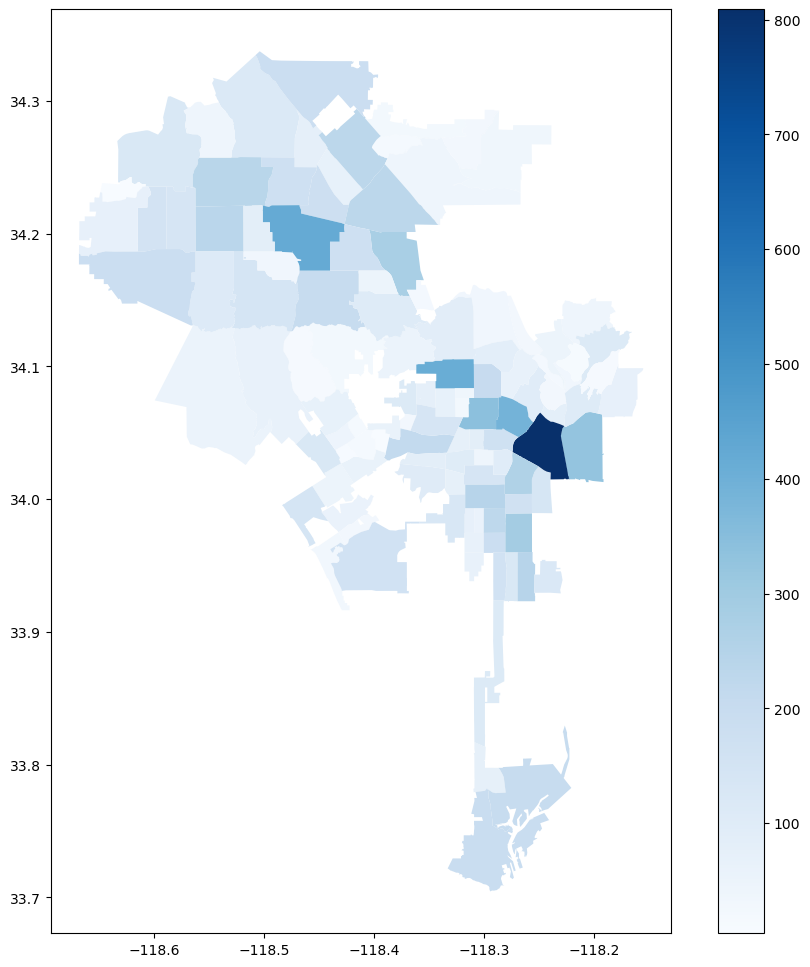

In [62]:
# choropleth map of traffic collisions by neighborhoods
import matplotlib.pyplot as plt
fig,ax = plt.subplots(figsize=(12,12))

neighborhoods.plot(ax=ax,column='collision_counts',legend=True,cmap='Blues')